In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/flowers-dataset/sample_submission.csv
/kaggle/input/flowers-dataset/Testing_set_flower.csv
/kaggle/input/flowers-dataset/LICENSE.txt
/kaggle/input/flowers-dataset/test/Image_747.jpg
/kaggle/input/flowers-dataset/test/Image_561.jpg
/kaggle/input/flowers-dataset/test/Image_345.jpg
/kaggle/input/flowers-dataset/test/Image_844.jpg
/kaggle/input/flowers-dataset/test/Image_270.jpg
/kaggle/input/flowers-dataset/test/Image_526.jpg
/kaggle/input/flowers-dataset/test/Image_322.jpg
/kaggle/input/flowers-dataset/test/Image_860.jpg
/kaggle/input/flowers-dataset/test/Image_574.jpg
/kaggle/input/flowers-dataset/test/Image_879.jpg
/kaggle/input/flowers-dataset/test/Image_22.jpg
/kaggle/input/flowers-dataset/test/Image_486.jpg
/kaggle/input/flowers-dataset/test/Image_608.jpg
/kaggle/input/flowers-dataset/test/Image_592.jpg
/kaggle/input/flowers-dataset/test/Image_352.jpg
/kaggle/input/flowers-dataset/test/Image_687.jpg
/kaggle/input/flowers-dataset/test/Image_278.jpg
/kaggle/input/flowers

># Loading data

In [2]:
data = '/kaggle/input/flowers-dataset/train'

In [3]:
classes = sorted(os.listdir(data))
print(classes)

['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']


In [4]:
import matplotlib.pyplot as plt
import random
from PIL import Image
import os

def display_random_images(data, classes= classes, num_images=3):
    
    plt.figure(figsize=(num_images * 3, len(classes) * 3))
    
    for class_idx, class_name in enumerate(classes):
        class_path = os.path.join(data, class_name)
        images = os.listdir(class_path)
        random_images = random.sample(images, num_images)
        
        for i, img_name in enumerate(random_images):
            img_path = os.path.join(class_path, img_name)
            img = Image.open(img_path)
            
            plt_idx = class_idx * num_images + i + 1
            plt.subplot(len(classes), num_images, plt_idx)
            plt.imshow(img)
            plt.axis('off')
            if i == 1:  # Center image to display class name
                plt.title(class_name)
    
    plt.tight_layout()
    plt.show()

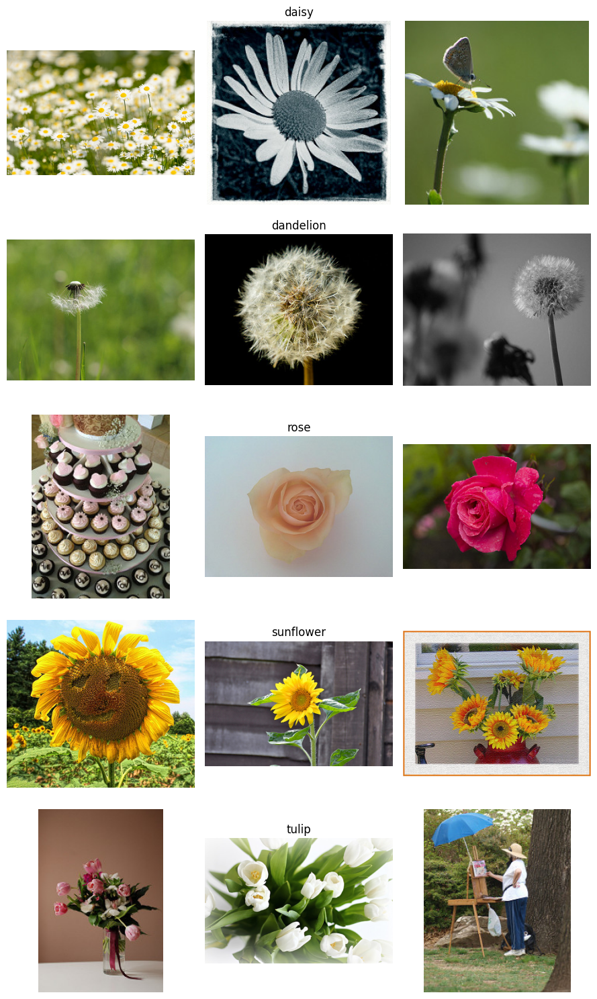

In [5]:
display_random_images(data)

In [6]:
import pandas as pd

# Load the CSVs
image_names_df = pd.read_csv('/kaggle/input/flowers-dataset/Testing_set_flower.csv')
labels_df = pd.read_csv('/kaggle/input/flowers-dataset/sample_submission.csv')

print("Image names CSV columns:", image_names_df.columns.tolist())
print("Labels CSV columns:", labels_df.columns.tolist())

Image names CSV columns: ['filename']
Labels CSV columns: ['prediction']


In [7]:
labels_df.shape

(924, 1)

In [12]:
labels_df['prediction'].unique()

array(['sunflower'], dtype=object)

In [9]:
image_names_df.shape

(924, 1)

In [14]:
import shutil
src_dir = '/kaggle/input/flowers-dataset/train'
dst_dir = '/kaggle/working/Data'

os.makedirs(dst_dir, exist_ok=True)

for folder_name in os.listdir(src_dir):
    src_path = os.path.join(src_dir, folder_name)
    dst_path = os.path.join(dst_dir, folder_name)
    
    if os.path.isdir(src_path):
        shutil.copytree(src_path, dst_path, dirs_exist_ok=True)

print("Training data successfully copied to /kaggle/working/Data.")

Training data successfully copied to /kaggle/working/Data.


In [15]:
data = '/kaggle/working/Data'

In [16]:
classes = sorted(os.listdir(data))
print(classes)

['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']


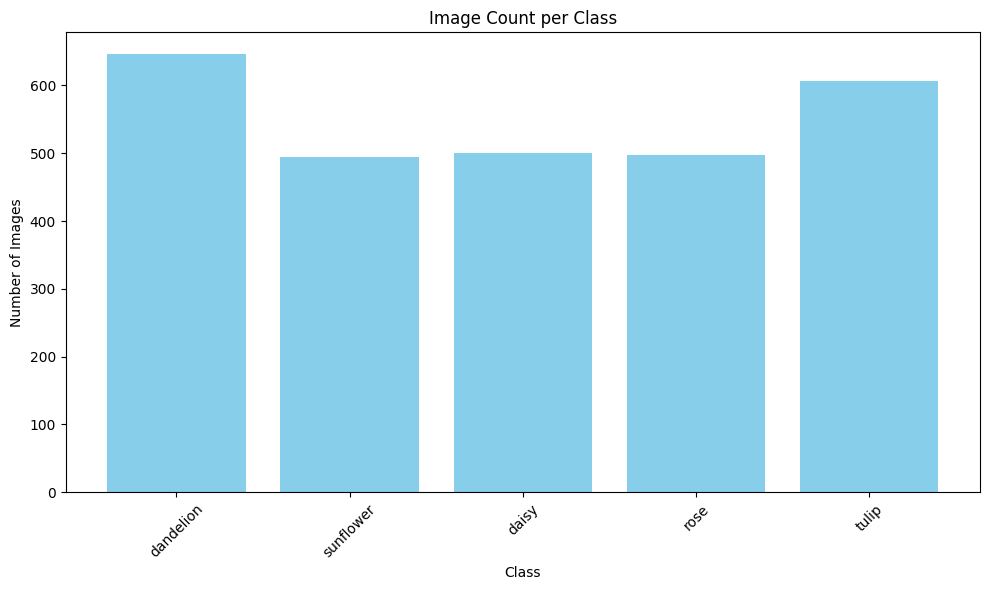

In [17]:
import matplotlib.pyplot as plt

class_counts = {}
for class_name in os.listdir(data):
    class_path = os.path.join(data, class_name)
    if os.path.isdir(class_path):
        count = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])
        class_counts[class_name] = count

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.title('Image Count per Class')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [18]:
import os
import shutil
import random
from pathlib import Path

def split_dataset(source_dir, output_dir, train_ratio=0.8, val_ratio=0.1, test_ratio=0.1, seed=42):
    random.seed(seed)
    assert train_ratio + val_ratio + test_ratio == 1.0, "Ratios must sum to 1."

    # Define output folders
    for split in ['train', 'val', 'test']:
        os.makedirs(os.path.join(output_dir, split), exist_ok=True)

    # Go through each class
    for class_name in os.listdir(source_dir):
        class_path = os.path.join(source_dir, class_name)
        if not os.path.isdir(class_path):
            continue

        images = [f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff', '.webp'))]
        random.shuffle(images)

        total = len(images)
        train_end = int(total * train_ratio)
        val_end = train_end + int(total * val_ratio)

        splits = {
            'train': images[:train_end],
            'val': images[train_end:val_end],
            'test': images[val_end:]
        }

        for split, split_images in splits.items():
            split_class_dir = os.path.join(output_dir, split, class_name)
            os.makedirs(split_class_dir, exist_ok=True)
            for img in split_images:
                src = os.path.join(class_path, img)
                dst = os.path.join(split_class_dir, img)
                shutil.copy2(src, dst)

    print("Dataset split complete.")

split_dataset('/kaggle/working/Data', '/kaggle/working/Dataset')

Dataset split complete.


In [19]:
data = '/kaggle/working/Dataset/train'
val_data = '/kaggle/working/Dataset/val'
test_data = '/kaggle/working/Dataset/test'

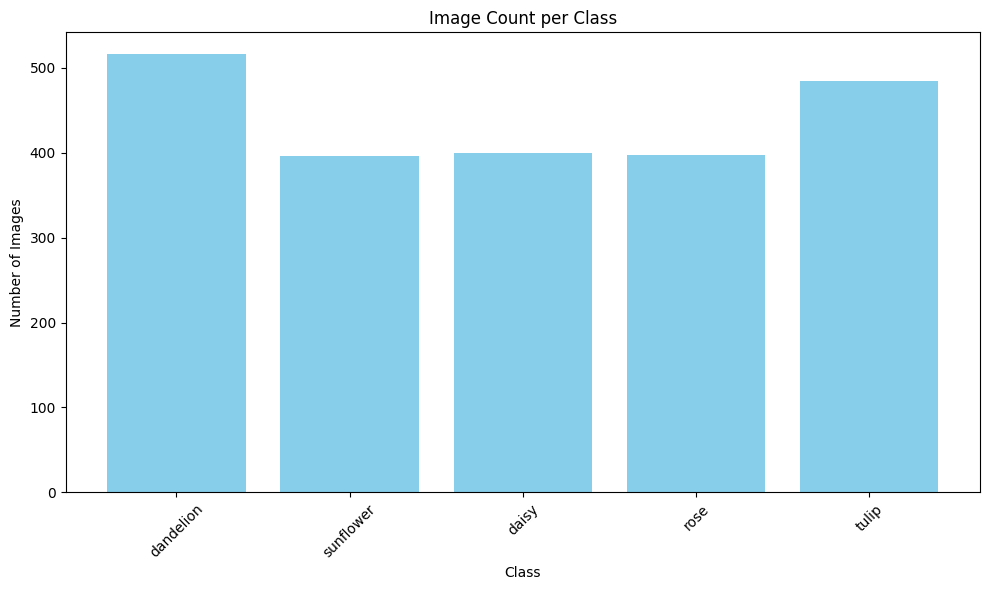

In [20]:
import matplotlib.pyplot as plt

class_counts = {}
for class_name in os.listdir(data):
    class_path = os.path.join(data, class_name)
    if os.path.isdir(class_path):
        count = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])
        class_counts[class_name] = count

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.title('Image Count per Class')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

> # A) Preprocessing

# 1. Data Augmentation

In [21]:
import random
from PIL import Image
from torchvision import transforms
from collections import defaultdict

augment = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.RandomResizedCrop(size=224, scale=(0.8, 1.0)),
])

class_counts = {cls: len(os.listdir(os.path.join(data, cls)))
                for cls in os.listdir(data)
                if os.path.isdir(os.path.join(data, cls))}

max_count = 800

for cls, count in class_counts.items():
    cls_path = os.path.join(data, cls)
    images = [f for f in os.listdir(cls_path) if f.lower().endswith(('jpg', 'png', 'jpeg'))]
    
    i = 0
    while count < max_count:
        img_name = random.choice(images)
        img_path = os.path.join(cls_path, img_name)
        
        with Image.open(img_path) as img:
            img = img.convert('RGB')
            augmented = augment(img)
            new_filename = f'aug_{i}_{img_name}'
            augmented.save(os.path.join(cls_path, new_filename))
        
        count += 1
        i += 1

print("Dataset balanced with augmentation.")

Dataset balanced with augmentation.


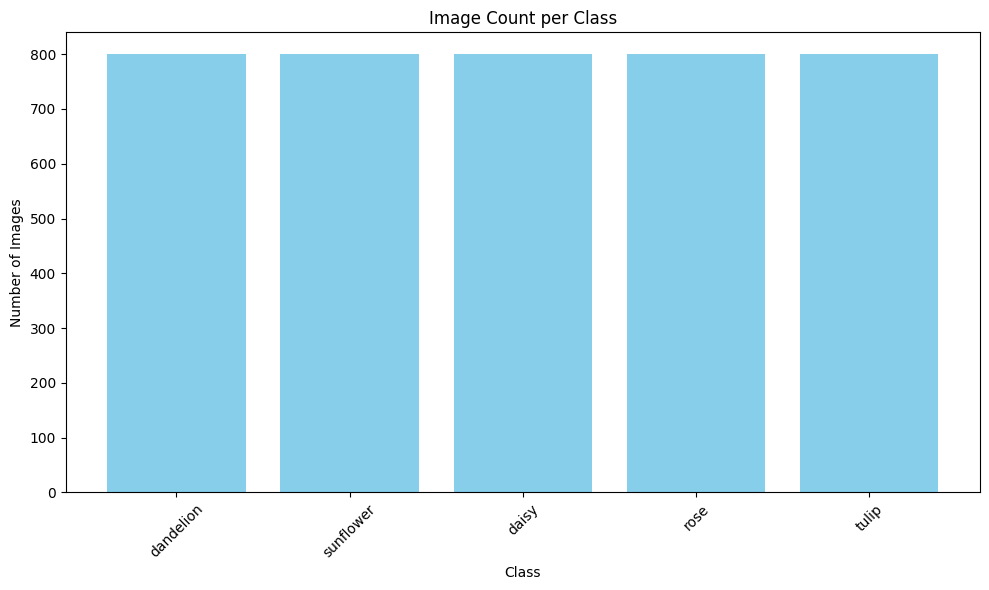

In [22]:
import matplotlib.pyplot as plt

class_counts = {}
for class_name in os.listdir(data):
    class_path = os.path.join(data, class_name)
    if os.path.isdir(class_path):
        count = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])
        class_counts[class_name] = count

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.title('Image Count per Class')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

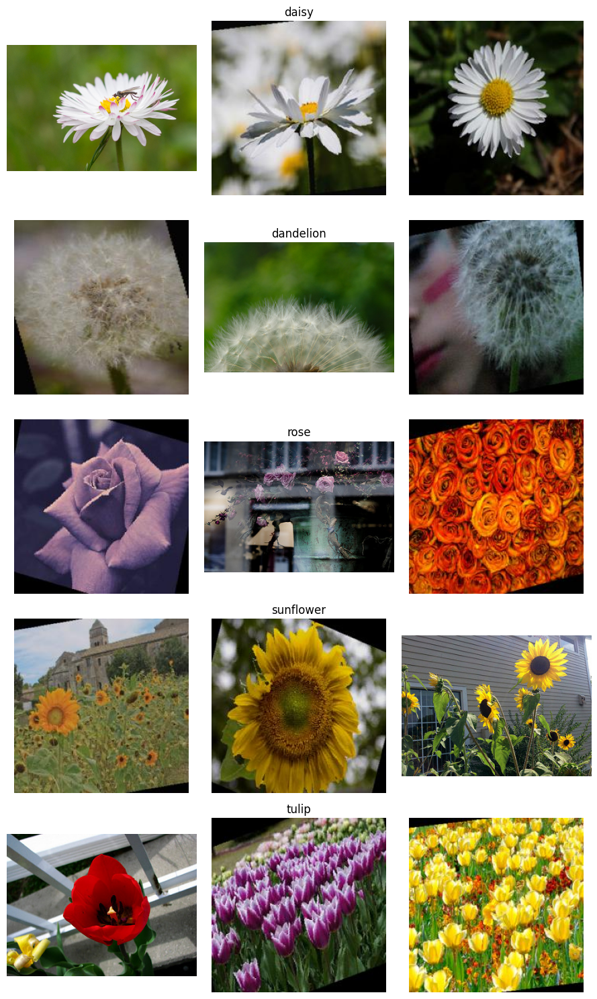

In [24]:
display_random_images(data)

# 2. Image Resizing

In [25]:
def resize_images(folder_path, size=(256, 256)):
    valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff', '.webp')

    for filename in os.listdir(folder_path):
        if filename.lower().endswith(valid_extensions):
            img_path = os.path.join(folder_path, filename)
            img = cv2.imread(img_path)

            if img is not None:
                resized = cv2.resize(img, size)
                cv2.imwrite(img_path, resized)

In [26]:
resize_images(data)
resize_images(val_data)
resize_images(test_data)

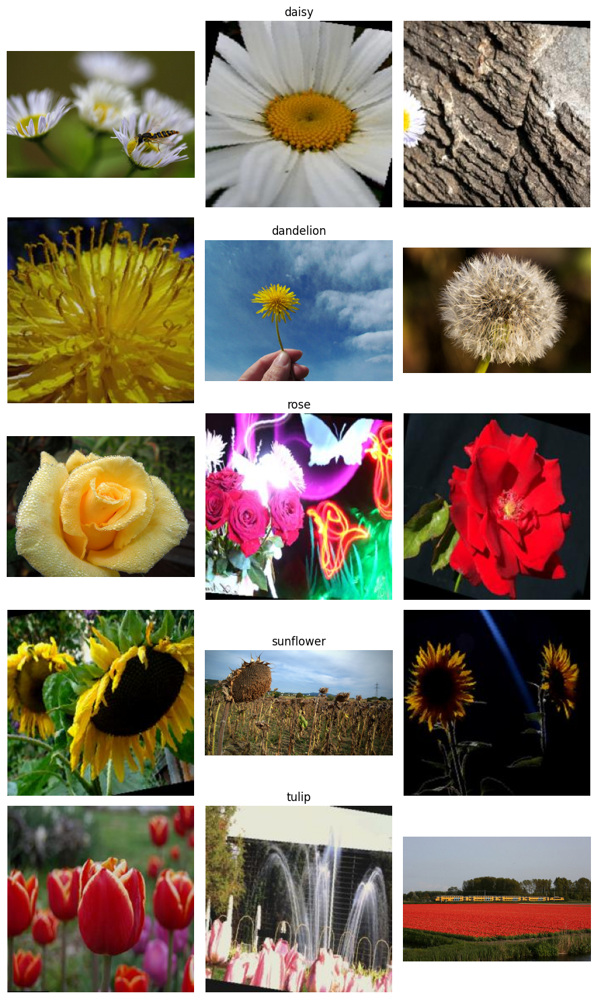

In [27]:
display_random_images(data)

# 3. Normalization

In [28]:
import cv2
def normalize_images(folder_path):
    valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff', '.webp')

    for root, _, files in os.walk(folder_path):
        for filename in files:
            if filename.lower().endswith(valid_extensions):
                img_path = os.path.join(root, filename)
                img = cv2.imread(img_path)

                if img is not None:
                    img_norm = img.astype('float32') / 255.0

                    img_norm_uint8 = (img_norm * 255).astype('uint8')
                    cv2.imwrite(img_path, img_norm_uint8)

In [29]:
normalize_images(data)
normalize_images(val_data)
normalize_images(test_data)

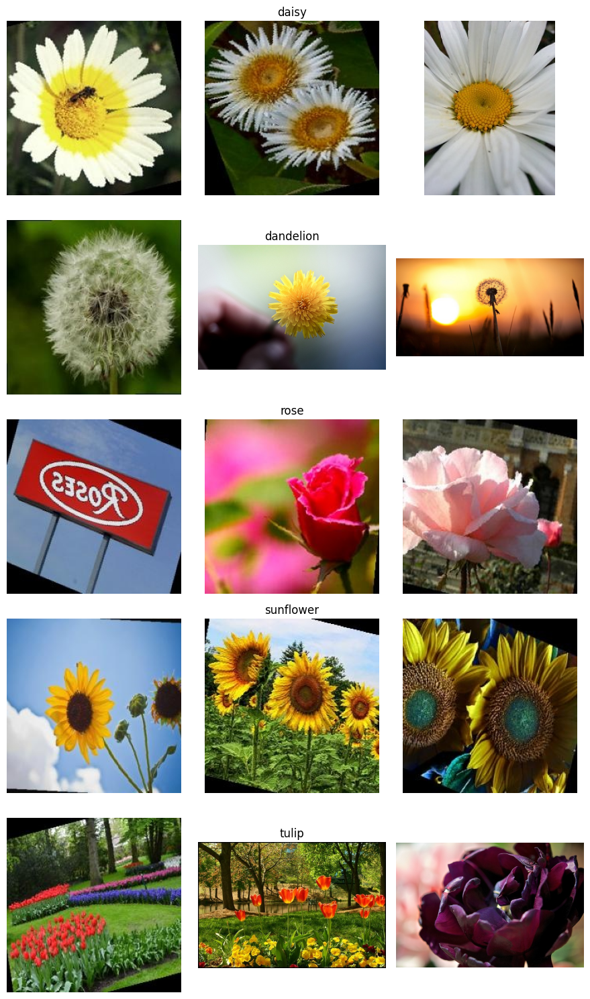

In [30]:
display_random_images(data)

# 4. Noise Reduction 

In [31]:
import cv2
def reduce_noise(folder_path, kernel_size=(3, 3)):
    valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff', '.webp')

    for root, _, files in os.walk(folder_path):
        for filename in files:
            if filename.lower().endswith(valid_extensions):
                img_path = os.path.join(root, filename)
                img = cv2.imread(img_path)

                if img is not None:
                    denoised = cv2.GaussianBlur(img, kernel_size, 0)
                    cv2.imwrite(img_path, denoised)
                else:
                    print(f"Warning: Could not read {img_path}")

In [32]:
reduce_noise(data)
reduce_noise(val_data)
reduce_noise(test_data)

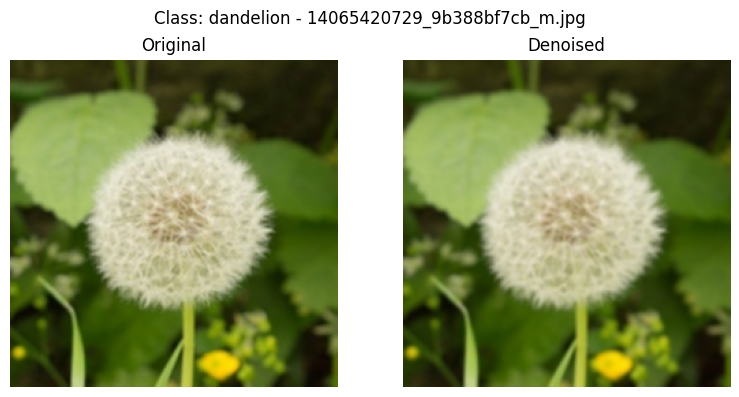

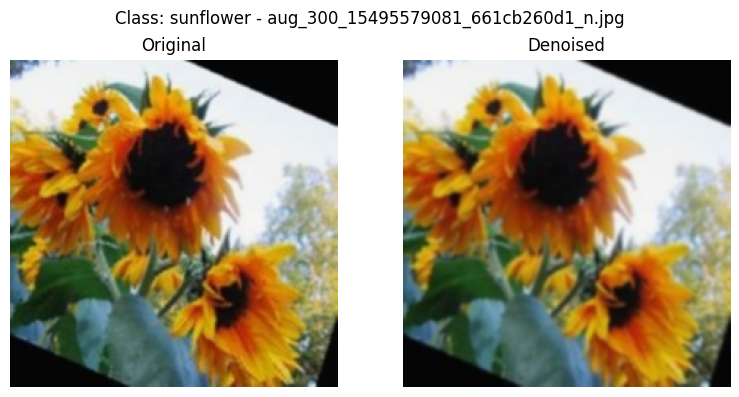

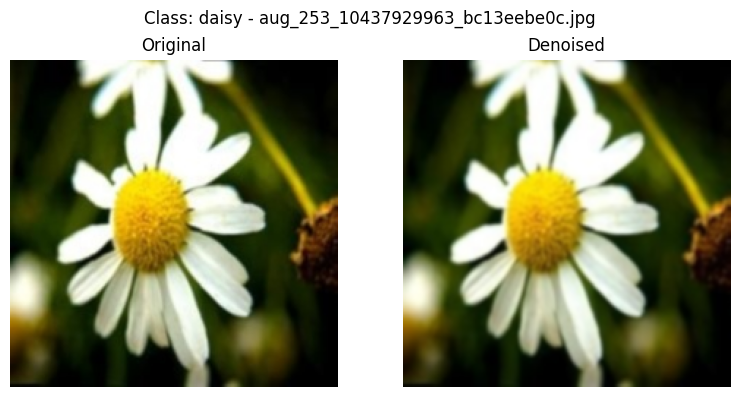

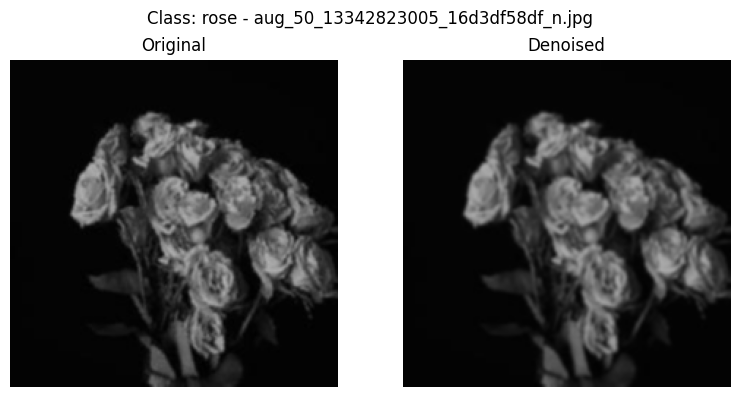

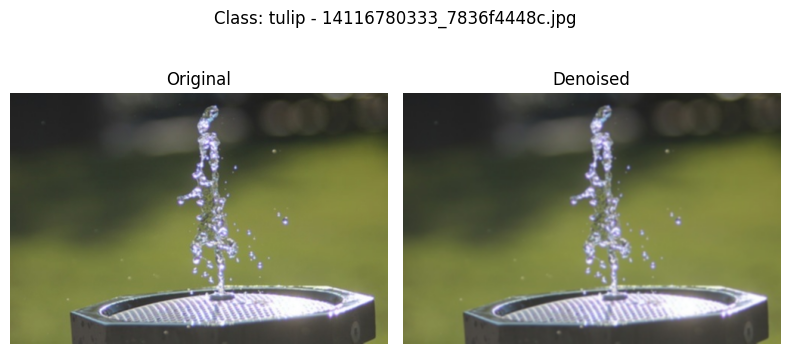

In [33]:
kernel_size = (3, 3)

class_names = [d for d in os.listdir(data) if os.path.isdir(os.path.join(data, d))]

for class_name in class_names:
    class_path = os.path.join(data, class_name)
    image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    
    if not image_files:
        continue

    img_name = random.choice(image_files)
    img_path = os.path.join(class_path, img_name)

    # Read and process the image
    img = cv2.imread(img_path)
    if img is None:
        continue

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    denoised = cv2.GaussianBlur(img_rgb, kernel_size, 0)

    # Plot original and denoised
    plt.figure(figsize=(8, 4))
    plt.suptitle(f"Class: {class_name} - {img_name}", fontsize=12)

    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)
    plt.title("Original")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(denoised)
    plt.title("Denoised")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# 5. Contrast Adjustment (CLAHE)

In [34]:
def apply_clahe(root_folder):
    valid_ext = ('.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff', '.webp')
    
    for root, _, files in os.walk(root_folder):
        for file in files:
            if file.lower().endswith(valid_ext):
                image_path = os.path.join(root, file)
                try:
                    img = cv2.imread(image_path)
                    if img is None:
                        raise ValueError(f"Failed to read image: {image_path}")
                    
                    # Convert to LAB and apply CLAHE
                    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
                    l, a, b = cv2.split(lab)
                    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
                    l_clahe = clahe.apply(l)
                    lab_clahe = cv2.merge((l_clahe, a, b))
                    img_clahe = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2BGR)
                    
                    # Overwrite original image
                    cv2.imwrite(image_path, img_clahe)
                    
                except Exception as e:
                    print(f"Error processing {image_path}: {e}")

In [35]:
apply_clahe(data)
apply_clahe(val_data)
apply_clahe(test_data)

In [36]:
def compare_before_after(original_root, enhanced_root, num_samples=5):
    valid_ext = ('.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff', '.webp')
    original_images = []

    for root, _, files in os.walk(original_root):
        for file in files:
            if file.lower().endswith(valid_ext):
                rel_path = os.path.relpath(os.path.join(root, file), original_root)
                original_images.append(rel_path)

    samples = random.sample(original_images, min(num_samples, len(original_images)))

    for rel_path in samples:
        orig_path = os.path.join(original_root, rel_path)
        enh_path = os.path.join(enhanced_root, rel_path)

        orig = cv2.imread(orig_path)
        enh = cv2.imread(enh_path)

        if orig is None or enh is None:
            print(f"Could not load: {rel_path}")
            continue

        orig_rgb = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB)
        enh_rgb = cv2.cvtColor(enh, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(8, 4))
        plt.suptitle(rel_path, fontsize=10)
        
        plt.subplot(1, 2, 1)
        plt.imshow(orig_rgb)
        plt.title("Original")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(enh_rgb)
        plt.title("Enhanced (CLAHE)")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

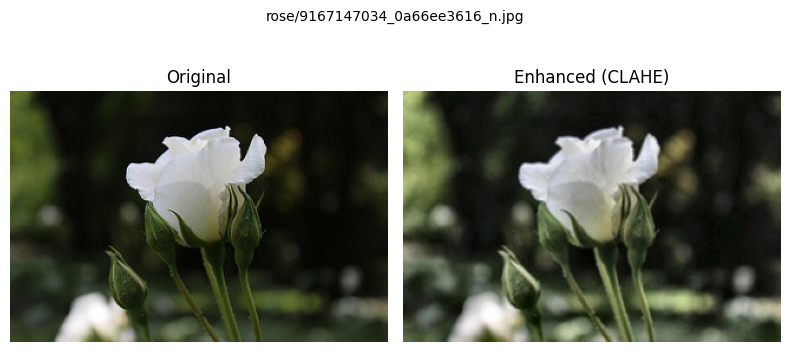

Could not load: sunflower/4746638094_f5336788a0_n.jpg


[ WARN:0@56.342] global loadsave.cpp:268 findDecoder imread_('/kaggle/working/Dataset/train/sunflower/4746638094_f5336788a0_n.jpg'): can't open/read file: check file path/integrity


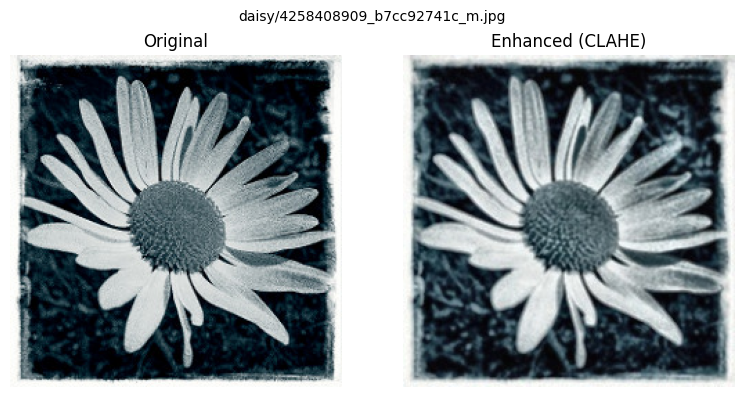

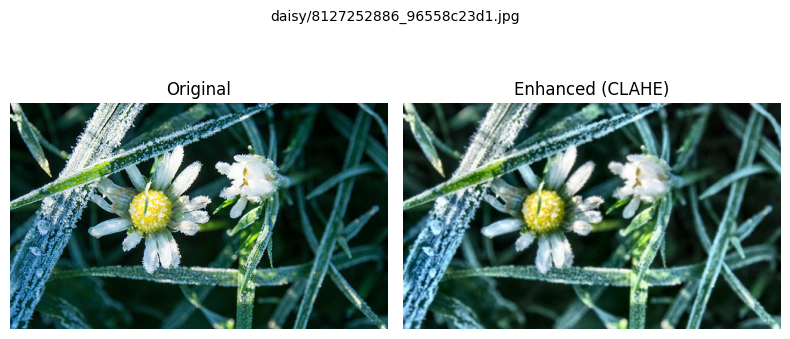

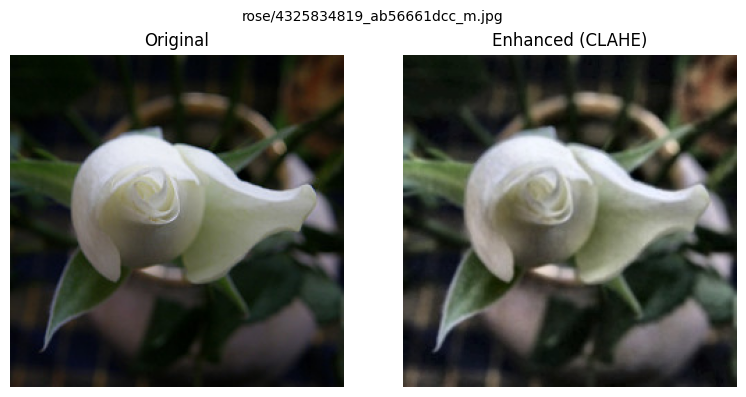

In [37]:
original_data = "/kaggle/input/flowers-dataset/train"
compare_before_after(original_data, data, num_samples=5)

# 6. Grayscaling

In [38]:
def to_grayscale(folder_path):
    valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff', '.webp')

    for root, _, files in os.walk(folder_path):
        for file in files:
            if file.lower().endswith(valid_extensions):
                img_path = os.path.join(root, file)

                img = cv2.imread(img_path)
                if img is not None:
                    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                    cv2.imwrite(img_path, gray)
                else:
                    print(f"Failed to read {img_path}")

In [39]:
to_grayscale(data)
to_grayscale(val_data)
to_grayscale(test_data)

In [40]:
def visualize_grayscale_samples(folder_path, n_samples=5):
    valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff', '.webp')
    image_paths = []

    for root, _, files in os.walk(folder_path):
        for file in files:
            if file.lower().endswith(valid_extensions):
                image_paths.append(os.path.join(root, file))

    random_samples = random.sample(image_paths, min(n_samples, len(image_paths)))

    plt.figure(figsize=(15, 5))
    for i, path in enumerate(random_samples):
        img = cv2.imread(path)
        if img is not None:
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            plt.subplot(1, n_samples, i + 1)
            plt.imshow(gray, cmap='gray')
            plt.title(os.path.basename(path))
            plt.axis('off')
        else:
            print(f"Failed to read: {path}")
    plt.tight_layout()
    plt.show()

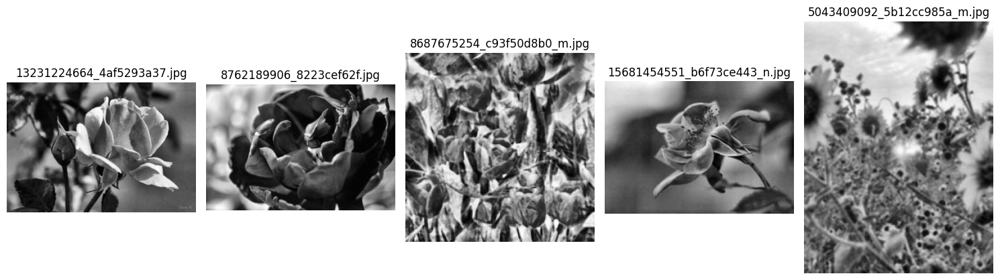

In [41]:
visualize_grayscale_samples(data)

# 7. Thresholding

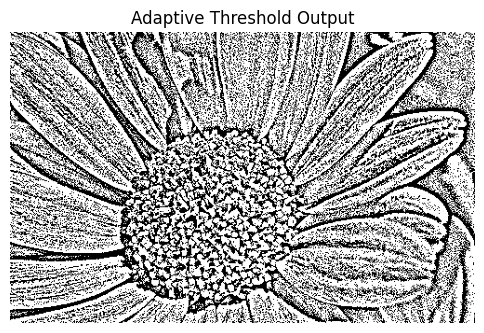

In [42]:
import cv2
import matplotlib.pyplot as plt

# Step 1: Load the image
img_path = '/kaggle/working/Data/daisy/10140303196_b88d3d6cec.jpg'
img = cv2.imread(img_path)

# Step 2: Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Step 3: Apply adaptive thresholding
img_thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                   cv2.THRESH_BINARY, 11, 2)

# Step 4: Display the thresholded image
plt.figure(figsize=(6, 6))
plt.imshow(img_thresh, cmap='gray')
plt.title('Adaptive Threshold Output')
plt.axis('off')
plt.show()

# 8. Blurring and Sharpening Filters

In [43]:
import os
import cv2
import numpy as np

def blur_sharpen(root_folder):
    valid_ext = ('.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff', '.webp')

    sharpen_kernel = np.array([[0, -0.5, 0],
                              [-0.5, 3, -0.5],
                              [0, -0.5, 0]], dtype=np.float32)

    for root, _, files in os.walk(root_folder):
        for file in files:
            if file.lower().endswith(valid_ext):
                image_path = os.path.join(root, file)
                try:
                    img = cv2.imread(image_path)
                    if img is None:
                        raise ValueError(f"Failed to read image: {image_path}")
                    
                    blurred = cv2.GaussianBlur(img, (3, 3), 0)
                    
                    sharpened = cv2.filter2D(blurred, -1, sharpen_kernel)
                    
                    cv2.imwrite(image_path, sharpened)

                except Exception as e:
                    print(f"Error processing {image_path}: {e}")

In [44]:
blur_sharpen(data)
blur_sharpen(val_data)
blur_sharpen(test_data)

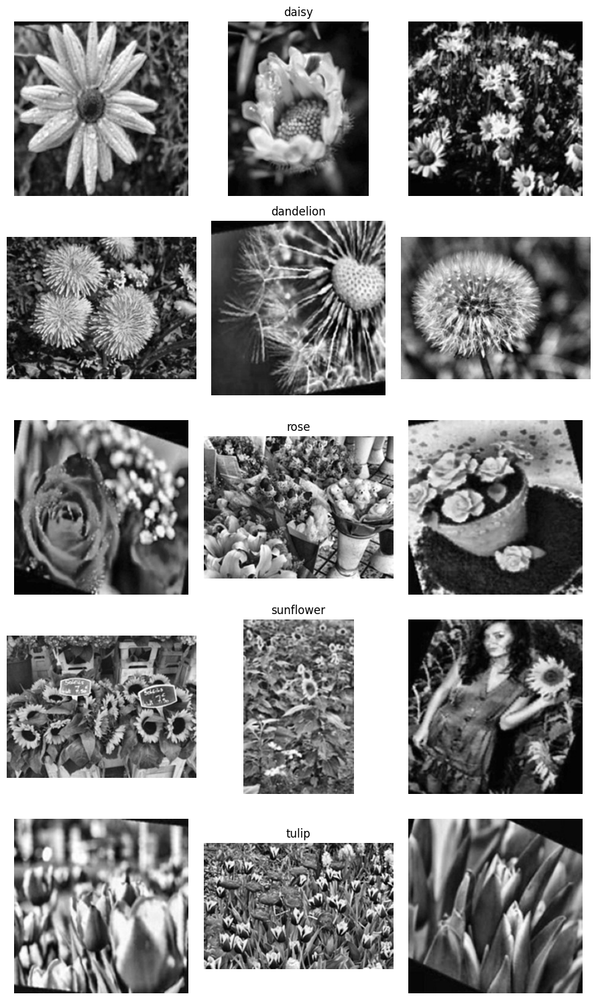

In [45]:
display_random_images(data)

# 9. Apply Morphological Operations (Open)

In [46]:
def morph(folder_path):
    valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff', '.webp')
    kernel = np.ones((3, 3), np.uint8)

    for root, _, files in os.walk(folder_path):
        for file in files:
            if file.lower().endswith(valid_extensions):
                img_path = os.path.join(root, file)
                img = cv2.imread(img_path)

                if img is not None:
                    img_morph = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)

                    cv2.imwrite(img_path, img_morph)
                else:
                    print(f"Failed to read image: {img_path}")

In [47]:
morph(data)
morph(val_data)
morph(test_data)

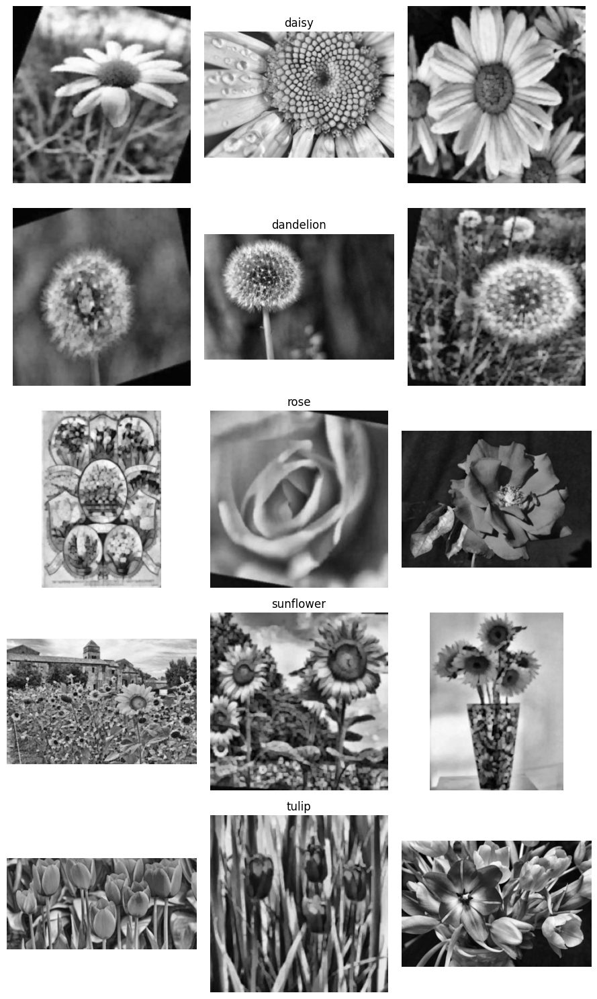

In [48]:
display_random_images(data)

> # B) Image Segmentation

# K-means Segmentation

In [66]:
from tqdm import tqdm

def segment(folder_path, output_root):
    valid_exts = ('.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff', '.webp')

    for root, _, files in os.walk(folder_path):
        for file in tqdm(files, desc=f"Processing in {os.path.basename(root)}"):
            if file.lower().endswith(valid_exts):
                img_path = os.path.join(root, file)
                img = cv2.imread(img_path)
                if img is None:
                    continue
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

                results = segment_image(img)

                # Preserve subfolder structure
                rel_path = os.path.relpath(root, folder_path)
                out_dir = os.path.join(output_root, rel_path)
                os.makedirs(out_dir, exist_ok=True)

                base_name = os.path.splitext(file)[0]
                for method, result in results.items():
                    out_path = os.path.join(out_dir, f"{base_name}_{method.replace(' ', '_')}.png")
                    if len(result.shape) == 2:  # Grayscale
                        cv2.imwrite(out_path, result)
                    else:  # Color
                        cv2.imwrite(out_path, cv2.cvtColor(result, cv2.COLOR_RGB2BGR))

def segment_image(img):
    original = img.copy()
    
    # Step 1: Convert to Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Step 2: Adaptive Thresholding
    thresh = cv2.adaptiveThreshold(
        gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY_INV, 11, 2)

    # Step 3: Morphological Cleaning (Close small holes)
    kernel = np.ones((3, 3), np.uint8)
    closing = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=2)

    # Step 4: Sure Background (dilate)
    sure_bg = cv2.dilate(closing, kernel, iterations=3)

    # Step 5: Distance Transform → Sure Foreground
    dist_transform = cv2.distanceTransform(closing, cv2.DIST_L2, 5)
    ret, sure_fg = cv2.threshold(dist_transform, 0.5 * dist_transform.max(), 255, 0)
    sure_fg = np.uint8(sure_fg)

    # Step 6: Unknown Region
    unknown = cv2.subtract(sure_bg, sure_fg)

    # Step 7: Marker Labelling
    ret, markers = cv2.connectedComponents(sure_fg)

    # Step 8: Watershed Segmentation
    markers = markers + 1
    markers[unknown == 255] = 0
    markers = cv2.watershed(original, markers)

    # Step 9: Draw Boundaries
    segmented = original.copy()
    segmented[markers == -1] = [255, 0, 0]

    return {
        "Original": original,
        "Thresholded": thresh,
        "Segmented": segmented
    }

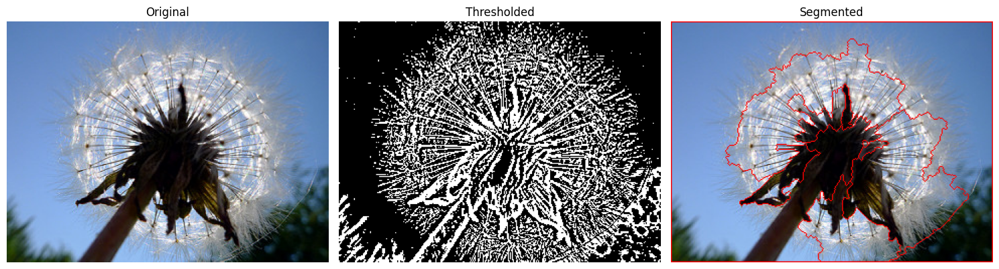

In [68]:
import matplotlib.pyplot as plt

results = segment_image(img)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(results["Original"])
plt.title("Original")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(results["Thresholded"], cmap='gray')
plt.title("Thresholded")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(results["Segmented"])
plt.title("Segmented")
plt.axis("off")

plt.tight_layout()
plt.show()

In [69]:
segment(data, '/kaggle/working/Segmented_data/train')

Processing in train: 0it [00:00, ?it/s]
Processing in tulip: 100%|██████████| 800/800 [00:13<00:00, 58.50it/s]


In [70]:
def visualize_segmentation(data_folder, segment_func):
    valid_exts = ('.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff', '.webp')

    # Collect all image paths
    image_paths = [os.path.join(root, file)
                   for root, _, files in os.walk(data_folder)
                   for file in files if file.lower().endswith(valid_exts)]

    if not image_paths:
        print("No valid images found in the specified directory.")
        return

    # Select and read a random image
    random_path = random.choice(image_paths)
    img = cv2.imread(random_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Apply segmentation
    segmented = segment_func(img_rgb)

    # Plot results
    plt.figure(figsize=(15, 8))
    for i, (title, result_img) in enumerate(segmented.items()):
        plt.subplot(2, 3, i + 1)
        cmap = "gray" if len(result_img.shape) == 2 else None
        plt.imshow(result_img, cmap=cmap)
        plt.title(title)
        plt.axis("off")

    plt.suptitle(f"Segmentation Results for:\n{os.path.basename(random_path)}", fontsize=14)
    plt.tight_layout()
    plt.show()

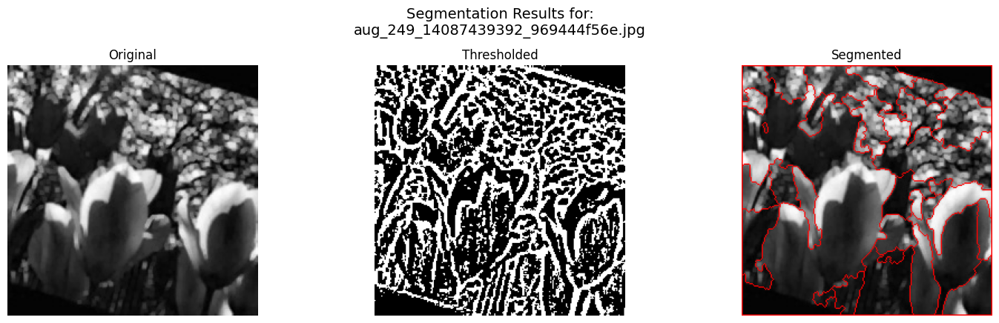

In [78]:
visualize_segmentation(data, segment_image)

In [79]:
segment(val_data, '/kaggle/working/Segmented_data/val')

Processing in val: 0it [00:00, ?it/s]
Processing in tulip: 100%|██████████| 60/60 [00:01<00:00, 46.10it/s]


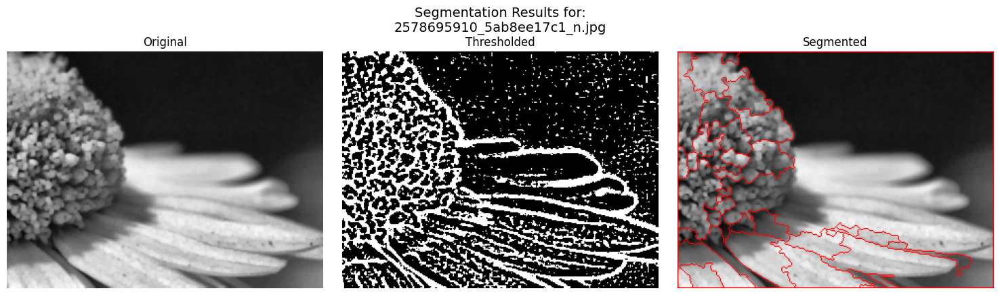

In [86]:
visualize_segmentation(val_data, segment_image)

In [81]:
segment(test_data, '/kaggle/working/Segmented_data/test')

Processing in test: 0it [00:00, ?it/s]
Processing in tulip: 100%|██████████| 62/62 [00:01<00:00, 44.71it/s]


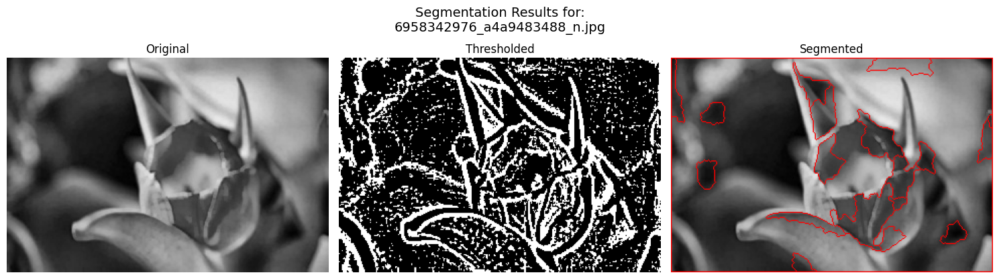

In [82]:
visualize_segmentation(test_data, segment_image)

In [87]:
def apply_canny_and_draw_boxes(img, min_area=1000):
    # Ensure grayscale
    if len(img.shape) == 3 and img.shape[2] == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img

    # Canny + morphology
    edges = cv2.Canny(gray, 50, 150)
    kernel = np.ones((3, 3), np.uint8)
    edges_dilated = cv2.dilate(edges, kernel, iterations=1)

    # Find contours
    contours, _ = cv2.findContours(edges_dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Draw boxes
    boxed_img = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)  # Ensure 3-channel image to draw on
    boxes = []
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area >= min_area:
            x, y, w, h = cv2.boundingRect(cnt)
            boxes.append((x, y, w, h))
            cv2.rectangle(boxed_img, (x, y), (x + w, y + h), (0, 255, 0), 2)

    return boxed_img, boxes

In [88]:
def preprocess_image(img):
    #Resizing
    img_resized = cv2.resize(img, (256, 256))
    #Normalization
    img_norm = img_resized/255.0
    #Noise Reduction
    img_denoised = cv2.GaussianBlur(img_norm, (3, 3), 0)
    #CLAHE
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l_clahe = clahe.apply(l)
    lab_clahe = cv2.merge((l_clahe, a, b))
    img_clahe = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2BGR)
    
    #Grayscaling
    gray_scaled = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    #Bluring-Sharpening filter
    sharpen_kernel = np.array([[0, -0.5, 0],
                              [-0.5, 3, -0.5],
                              [0, -0.5, 0]], dtype=np.float32)

    blurred = cv2.GaussianBlur(gray_scaled, (3, 3), 0)
    sharpened = cv2.filter2D(blurred, -1, sharpen_kernel)
    #Morphological Operations (to clean any noise)
    kernel = np.ones((3, 3), np.uint8)
    img_morph = cv2.morphologyEx(sharpened, cv2.MORPH_CLOSE, kernel)

    return img_resized, img_morph


Class: dandelion
✅ 1 object(s) detected in 9517326597_5d116a0166.jpg


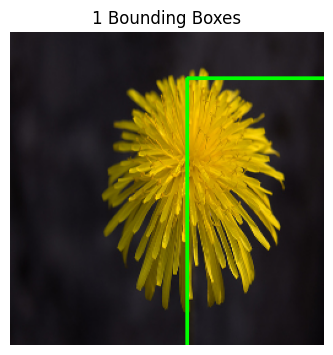


Class: daisy
✅ 2 object(s) detected in 4413849849_b8d2f3bcf1_n.jpg


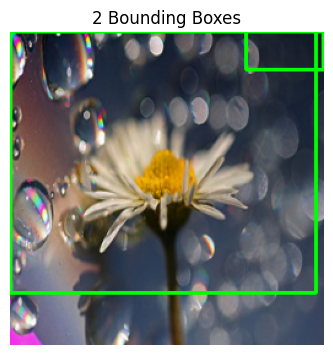


Class: sunflower
✅ 1 object(s) detected in 20704967595_a9c9b8d431.jpg


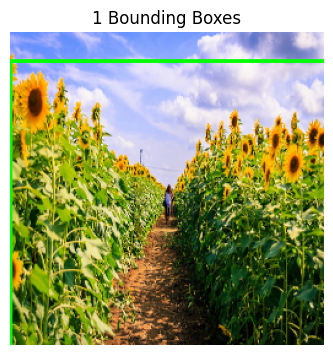


Class: tulip
✅ 1 object(s) detected in 8712270665_57b5bda0a2_n.jpg


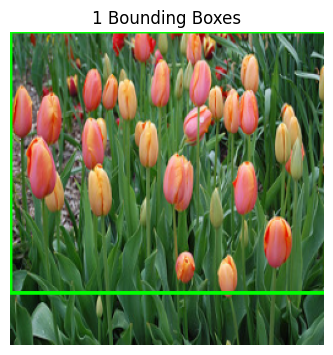


Class: rose
✅ 1 object(s) detected in 3661675690_ed2d05fa5f_n.jpg


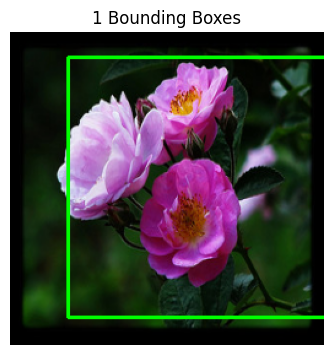

In [91]:
from random import sample

base_path = '/kaggle/input/flowers-dataset/train/'
class_names = os.listdir(base_path)
num_samples = 1

for cls in class_names:
    cls_path = os.path.join(base_path, cls)
    images = [f for f in os.listdir(cls_path) if f.endswith(('.jpg', '.png'))]
    selected = sample(images, min(num_samples, len(images)))

    print(f"\nClass: {cls}")

    for filename in selected:
        path = os.path.join(cls_path, filename)
        img = cv2.imread(path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        before, preprocessed = preprocess_image(img_rgb)

        # Detect contours using preprocessed, but draw on original
        _, boxes = apply_canny_and_draw_boxes(preprocessed)

        # Draw boxes on a copy of the original resized image
        boxed_img = before.copy()
        for (x, y, w, h) in boxes:
            cv2.rectangle(boxed_img, (x, y), (x + w, y + h), (0, 255, 0), 2)

        print(f"✅ {len(boxes)} object(s) detected in {filename}")

        plt.figure(figsize=(10, 4))

        plt.subplot(1, 3, 3)
        plt.imshow(boxed_img)
        plt.title(f"{len(boxes)} Bounding Boxes")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

># C) Feature Extraction

In [92]:
import torch
import timm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = timm.create_model('mobilenetv2_100', pretrained=True, num_classes=0).to(device)
model.eval()

preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                         std=[0.229, 0.224, 0.225])
])

In [93]:
def get_image_paths(root_dir, valid_exts=('.jpg', '.jpeg', '.png')):
    image_paths = []
    for root, _, files in os.walk(root_dir):
        for file in files:
            if file.lower().endswith(valid_exts):
                image_paths.append(os.path.join(root, file))
    return image_paths

def extract_features(image_paths, model, preprocess, device):
    features = []
    for path in image_paths:
        try:
            img = Image.open(path).convert('RGB')
            input_tensor = preprocess(img).unsqueeze(0).to(device)
            with torch.no_grad():
                output = model(input_tensor)
            features.append(output.cpu().numpy().squeeze())
        except Exception as e:
            print(f"Failed on {path}: {e}")
    return np.array(features)

In [94]:
train_dir = '/kaggle/working/Segmented_data/train'
val_dir   = '/kaggle/working/Segmented_data/val'
test_dir  = '/kaggle/working/Segmented_data/test'

train_paths = get_image_paths(train_dir)
val_paths   = get_image_paths(val_dir)
test_paths  = get_image_paths(test_dir)

train_features = extract_features(train_paths, model, preprocess, device)
val_features   = extract_features(val_paths, model, preprocess, device)
test_features  = extract_features(test_paths, model, preprocess, device)

># D) Classification with MLP

In [97]:
import torch.nn as nn

class FeedForwardMLP(nn.Module):
    def __init__(self, input_dim, num_classes):
        super(FeedForwardMLP, self).__init__()
        self.fc = nn.Sequential(
            nn.Linear(input_dim, 256),
            nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        return self.fc(x)

In [98]:
from torch.utils.data import Dataset, DataLoader

class FeatureDataset(Dataset):
    def __init__(self, features, labels):
        self.features = torch.tensor(features, dtype=torch.float32)
        self.labels = torch.tensor(labels, dtype=torch.long)

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        return self.features[idx], self.labels[idx]

In [100]:
def get_labels(root_dir):
    labels = []
    class_names = sorted(os.listdir(root_dir))  # Ensure consistent order
    class_to_idx = {cls_name: idx for idx, cls_name in enumerate(class_names)}

    for cls_name in class_names:
        cls_dir = os.path.join(root_dir, cls_name)
        for fname in os.listdir(cls_dir):
            if fname.lower().endswith(('.jpg', '.png', '.jpeg', '.bmp')):
                labels.append(class_to_idx[cls_name])

    return labels

In [103]:
train_labels = get_labels('/kaggle/working/Segmented_data/train')
val_labels = get_labels('/kaggle/working/Segmented_data/val')
test_labels = get_labels('/kaggle/working/Segmented_data/test')

In [104]:
train_dataset = FeatureDataset(train_features, train_labels)
val_dataset = FeatureDataset(val_features, val_labels)
test_dataset = FeatureDataset(test_features, test_labels)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8)
test_loader = DataLoader(test_dataset, batch_size=8)

In [105]:
import torch.optim as optim

model = FeedForwardMLP(input_dim=train_features.shape[1], num_classes=len(np.unique(train_labels)))
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [ ]:
import torch.optim as optim

model = FeedForwardMLP(input_dim=train_features.shape[1], num_classes=len(np.unique(train_labels)))
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [ ]:
import torch.optim as optim

train_losses, train_accuracies = [], []
val_losses, val_accuracies = [], []

num_epochs = 20

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0

    loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Training]")
    for features, labels in loop:
        features, labels = features.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(features)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * features.size(0)
        _, predicted = torch.max(outputs, 1)
        correct += (predicted == labels).sum().item()

        loop.set_postfix(loss=loss.item())

    train_loss = running_loss / len(train_loader.dataset)
    train_acc = correct / len(train_loader.dataset)
    train_losses.append(train_loss)
    train_accuracies.append(train_acc)

    # Validation
    model.eval()
    val_running_loss = 0.0
    val_correct = 0
    val_loop = tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Validation]")
    with torch.no_grad():
        for features, labels in val_loop:
            features, labels = features.to(device), labels.to(device)
            outputs = model(features)
            loss = criterion(outputs, labels)
            val_running_loss += loss.item() * features.size(0)
            _, predicted = torch.max(outputs, 1)
            val_correct += (predicted == labels).sum().item()

            val_loop.set_postfix(loss=loss.item())

    val_loss = val_running_loss / len(val_loader.dataset)
    val_acc = val_correct / len(val_loader.dataset)
    val_losses.append(val_loss)
    val_accuracies.append(val_acc)

    print(f"\nEpoch {epoch+1} Completed — "
          f"Train Loss: {train_loss:.4f}, Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f}, Val acc: {val_acc:.4f}")

    # Save model after each epoch
    torch.save(model.state_dict(), f"modelMLP_epoch_{epoch+1}.pth")

In [109]:
print(val_accuracies)

[0.6740196078431373, 0.7132352941176471, 0.7328431372549019, 0.7095588235294118, 0.7193627450980392, 0.7291666666666666, 0.7218137254901961, 0.7193627450980392, 0.7156862745098039, 0.7205882352941176, 0.7120098039215687, 0.7132352941176471, 0.7144607843137255, 0.7181372549019608, 0.7218137254901961, 0.7169117647058824, 0.7046568627450981, 0.7071078431372549, 0.7132352941176471, 0.7120098039215687]


In [111]:
max_val = max(val_accuracies)
max_idx = val_accuracies.index(max_val)

print(f"Max Validation Accuracy: {max_val:.4f} at Epoch {max_idx+1}")

Max Validation Accuracy: 0.7328 at Epoch 3


In [113]:
model.eval()  # Set the model to evaluation mode
test_loss = 0.0
correct = 0
total = 0
criterion = torch.nn.CrossEntropyLoss()  # Loss function

with torch.no_grad():  # Disable gradient computation
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        
        test_loss += loss.item()  # Accumulate loss

        # Calculate accuracy
        _, predicted = torch.max(outputs, 1)
        correct += (predicted == labels).sum().item()
        total += labels.size(0)

# Calculate average loss and accuracy
test_loss /= len(test_loader)
test_acc = correct / total

# Print results
print(f'Test Loss: {test_loss:.4f}')
print(f'Test Accuracy: {test_acc * 100:.2f}%')

Test Loss: 3.3983
Test Accuracy: 73.21%


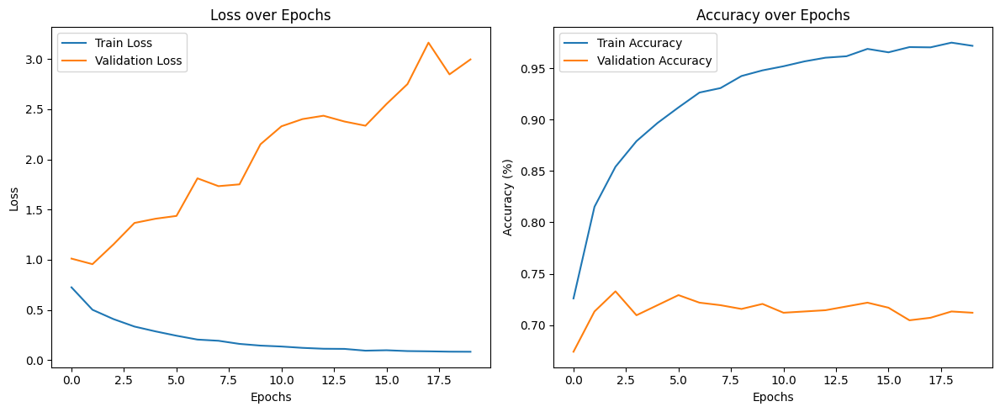

In [115]:
epochs = 20
plt.figure(figsize=(12, 5))

# Plot Loss
plt.subplot(1, 2, 1)
plt.plot(range(epochs), train_losses, label='Train Loss')
plt.plot(range(epochs), val_losses, label='Validation Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(range(epochs), train_accuracies, label='Train Accuracy')
plt.plot(range(epochs), val_accuracies, label='Validation Accuracy')
plt.title('Accuracy over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.legend()

plt.tight_layout()
plt.savefig("training_validation_curves.png")
plt.show()

In [116]:
!pip install docx

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.9/54.9 kB 1.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for docx: filename=docx-0.2.4-py3-none-any.whl size=53892 sha256=0520302e6127f46e0cd93adc2b284e0c4195ea9975ddadbcb108001efbf40961
  Stored in directory: /root/.cache/pip/wheels/c1/3e/c3/e81c11effd0be5658a035947c66792dd993bcff317eae0e1ed
Successfully built docx


In [117]:
!pip install --upgrade python-docx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.3/244.3 kB 5.6 MB/s eta 0:00:00a 0:00:01


In [120]:
from sklearn.metrics import classification_report
from docx import Document
import torch.nn as nn

model.eval()

all_preds = []
all_labels = []

test_loss = 0.0
correct = 0
total = 0

criterion = nn.CrossEntropyLoss()

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)
        
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        test_loss += loss.item() * inputs.size(0)
        
        _, preds = torch.max(outputs, 1)
        
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        
        correct += (preds == labels).sum().item()
        total += labels.size(0)

# Calculate average loss and accuracy
avg_test_loss = test_loss / total
test_accuracy = correct / total * 100

print(f"Test Loss: {avg_test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.2f}%")

Test Loss: 3.3983
Test Accuracy: 73.21%


In [123]:
from sklearn.metrics import classification_report
import torch
import numpy as np
from docx import Document

class_names = ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip'] 
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Get real class names from the dataset (assuming your dataset is set up correctly)
decoded_y_true = [class_names[label] for label in all_labels]
decoded_y_pred = [class_names[label] for label in all_preds]

# Generate the classification report as a dictionary
report_dict = classification_report(decoded_y_true, decoded_y_pred, output_dict=True)

# Create the Word document
doc = Document()
doc.add_heading('Classification Report', 0)

# Add test loss and accuracy (replace these with actual values)
doc.add_paragraph(f"Test Loss: {avg_test_loss:.4f}")
doc.add_paragraph(f"Test Accuracy: {test_accuracy:.3f}%")

# Create a table in the document
table = doc.add_table(rows=1, cols=6)  # 6 columns for: class, precision, recall, f1-score, support, and avg
table.style = 'Table Grid'

# Add the table headers
hdr_cells = table.rows[0].cells
hdr_cells[0].text = 'Class'
hdr_cells[1].text = 'Precision'
hdr_cells[2].text = 'Recall'
hdr_cells[3].text = 'F1-Score'
hdr_cells[4].text = 'Support'

# Iterate through the report dictionary and add rows to the table
for class_name, metrics in report_dict.items():
    if class_name not in ['accuracy', 'macro avg', 'weighted avg']:  # Exclude overall averages
        row_cells = table.add_row().cells
        row_cells[0].text = str(class_name)  # Class name
        row_cells[1].text = f"{metrics['precision']:.3f}"  # Precision
        row_cells[2].text = f"{metrics['recall']:.3f}"  # Recall
        row_cells[3].text = f"{metrics['f1-score']:.3f}"  # F1-Score
        row_cells[4].text = f"{metrics['support']:.0f}"  # Support

# Save the document
doc.save('classification_report_table.docx')

In [144]:
report = classification_report(decoded_y_true, decoded_y_pred)
print(report)

              precision    recall  f1-score   support

       daisy       0.65      0.75      0.70       153
   dandelion       0.76      0.67      0.71       198
        rose       0.69      0.63      0.66       153
   sunflower       0.81      0.71      0.76       150
       tulip       0.75      0.88      0.81       186

    accuracy                           0.73       840
   macro avg       0.73      0.73      0.73       840
weighted avg       0.74      0.73      0.73       840



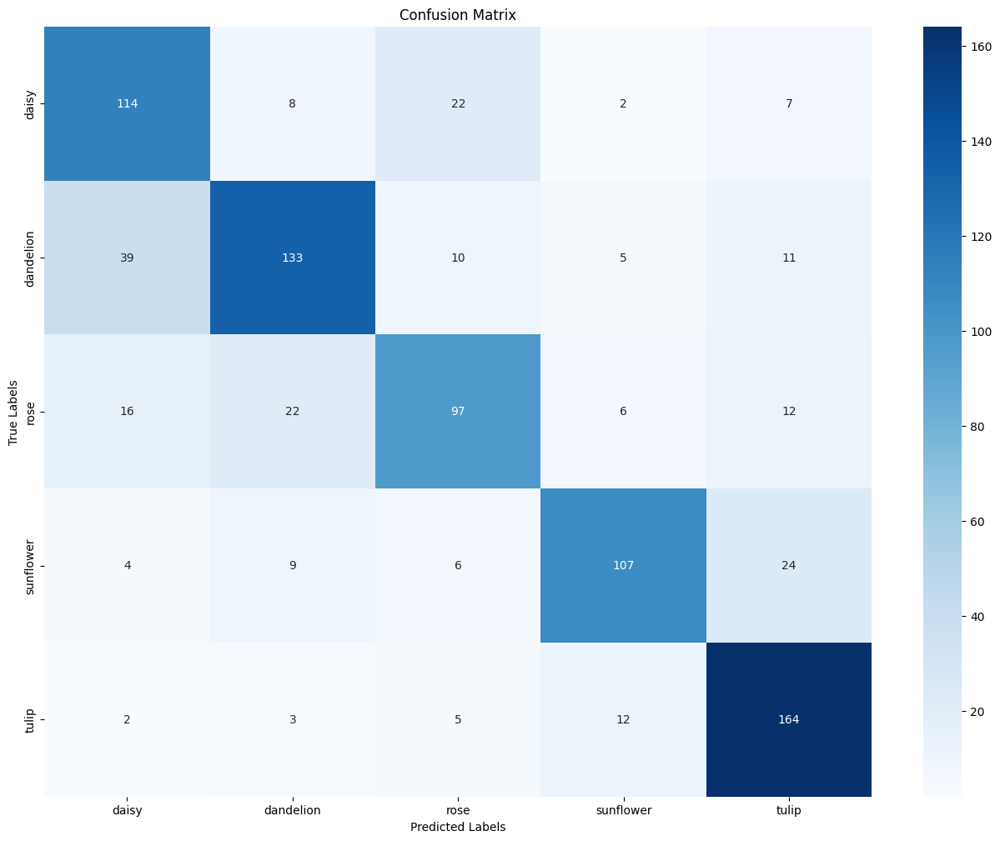

In [126]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Compute the confusion matrix
cm = confusion_matrix(all_labels, all_preds)

# Plotting the confusion matrix using Seaborn
plt.figure(figsize=(16, 12))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')

# Save the confusion matrix as an image
plt.savefig('confusion_matrix.png')

# Optionally, you can also display the plot
plt.show()

In [132]:
from sklearn.preprocessing import label_binarize

y_true_bin = label_binarize(all_labels, classes=np.arange(n_classes))

In [137]:
probs = torch.argmax(outputs, dim=1)

In [138]:
model.eval()
all_probs = []
all_labels = []

with torch.no_grad():
    for features, labels in test_loader:
        features = features.to(device)
        outputs = model(features)
        probs = torch.softmax(outputs, dim=1)

        all_probs.extend(probs.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

all_probs = np.array(all_probs)           # Shape: (num_samples, n_classes)
all_labels = np.array(all_labels)         # Shape: (num_samples,)

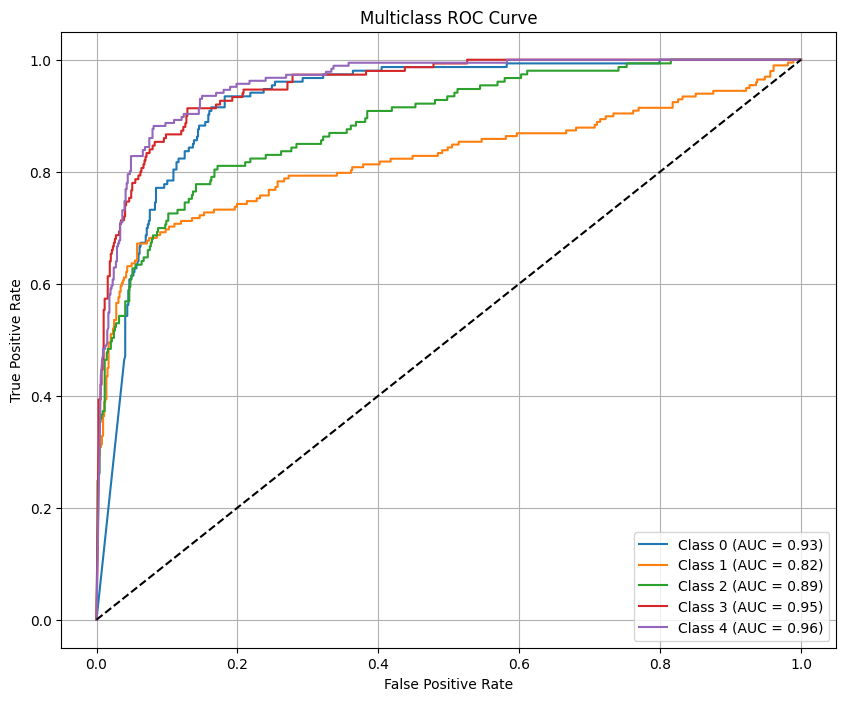

In [140]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

y_true_bin = label_binarize(all_labels, classes=np.arange(n_classes))  # One-hot
fpr = {}
tpr = {}
roc_auc = {}

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], all_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(10, 8))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multiclass ROC Curve')
plt.legend()
plt.grid(True)
plt.savefig('ROC.png')
plt.show()
